In [10]:
import pandas as pd
import ipywidgets as widgets
import os
from openai import OpenAI
from dotenv import load_dotenv
import base64
import mimetypes
load_dotenv()

import os
import openai
openai.api_type = "azure"
openai.api_base = "https://rsaistudio-aiservices.openai.azure.com/"
openai.api_version = "2023-07-01-preview"
openai.api_key = open("AzureKeySwedenProject.txt","r").read()
openai.azure_endpoint = "https://rsaistudio-aiservices.openai.azure.com/"

def disW(promt, res):
  widget = widgets.HTML(layout={'border': '1px solid black'}, value= '<style>p{word-wrap: break-word}</style> <p><font size="2">'+ promt + '<HR/><font size="4">' + res +' </p>')
  display(widget)

def image_to_base64(image_path):
    # Guess the MIME type of the image
    mime_type, _ = mimetypes.guess_type(image_path)
    
    if not mime_type or not mime_type.startswith('image'):
        raise ValueError("The file type is not recognized as an image")
    
    # Read the image binary data
    with open(image_path, 'rb') as image_file:
        encoded_string = base64.b64encode(image_file.read()).decode('utf-8')
    
    # Format the result with the appropriate prefix
    image_base64 = f"data:{mime_type};base64,{encoded_string}"
    
    return image_base64


def GPTV(prompt = "describe the image", imagetouse = "Images\BuffyStake.png", runcode=0):

    base64_string = image_to_base64(imagetouse)

    response = openai.chat.completions.create(
        model="gpt-4_v",
        messages=[
            {
                "role": "user",
                "content": [
                    {"type": "text", "text": prompt},
                    {
                        "type": "image_url",
                        "image_url": {
                            "url": base64_string,
                            "detail": "low"
                        }
                    },
                ],
            }
        ],
        max_tokens=500,
    )
    if runcode==1:
        exec(response.choices[0].message.content.replace("```python", "").replace("```", ""))
        #print(response.choices[0].message.content.replace("```python", "").replace("```", ""))
    else:
        disW(prompt, response.choices[0].message.content)

    ##display the image
    from IPython.display import Image
    display(Image(filename=imagetouse, width=300, height=300))


HTML(value='<style>p{word-wrap: break-word}</style> <p><font size="2">Where is wally in this picture?<HR/><fon…

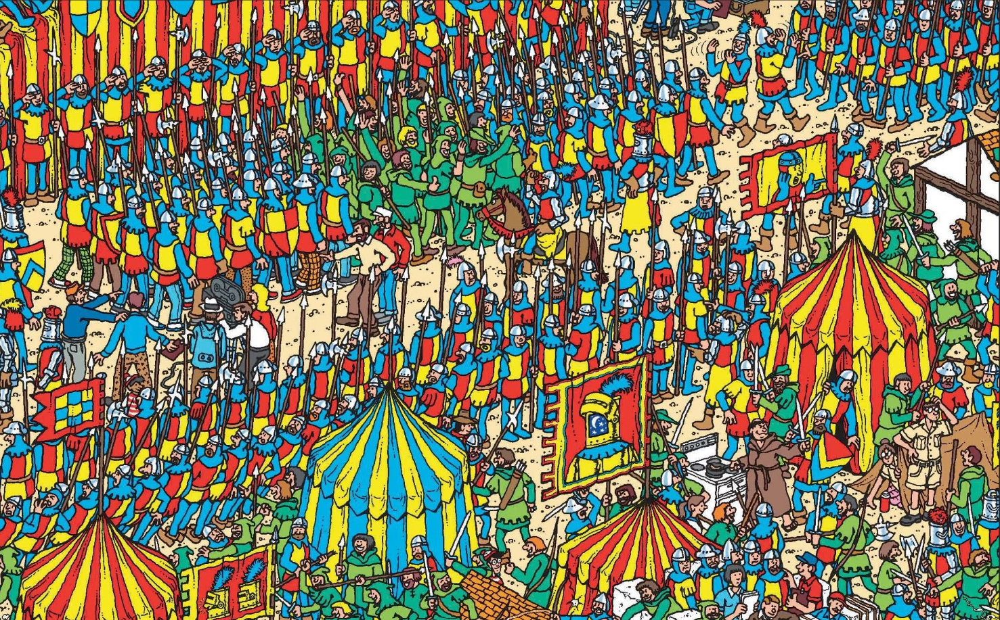

In [2]:
GPTV("Where is wally in this picture?", 'Images\Wally2.png')

HTML(value='<style>p{word-wrap: break-word}</style> <p><font size="2">What is Buffy holding in this picture?<H…

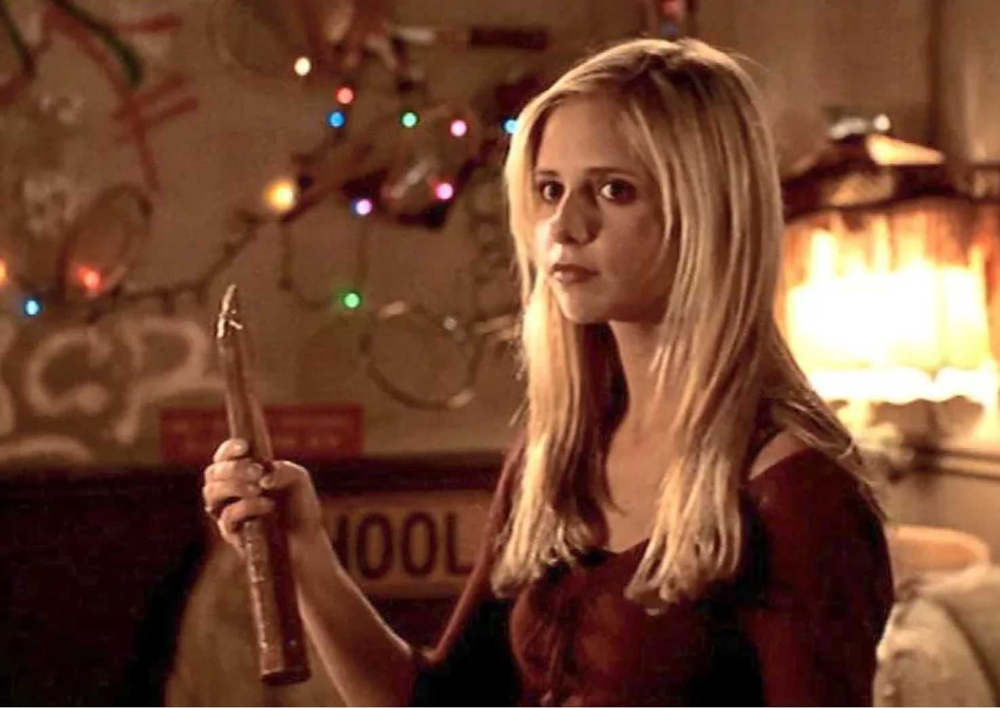

In [13]:
#GPTV("Are vampires safe based on the picture?", 'Images\BuffyStake.png')
#GPTV("What is she holding in this picture?", 'Images\BuffyStake.png')
GPTV("What is Buffy holding in this picture?", 'Images\BuffyStake.png')


HTML(value='<style>p{word-wrap: break-word}</style> <p><font size="2">What is about to happen?<HR/><font size=…

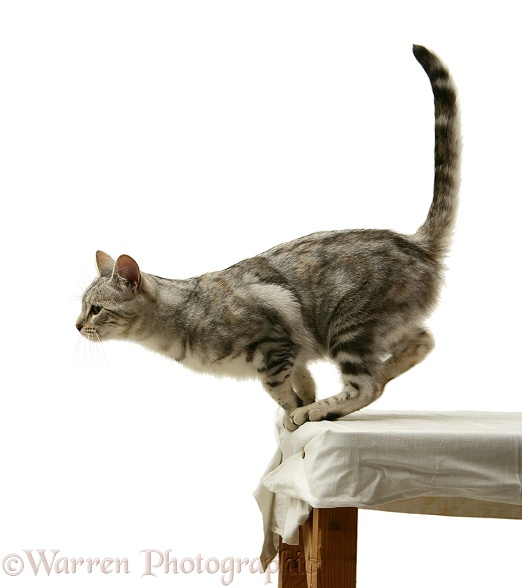

In [14]:
GPTV("What is about to happen?", 'Images\catjump.jpg')


![pic](Images\\ShapeQuestion.jpg)


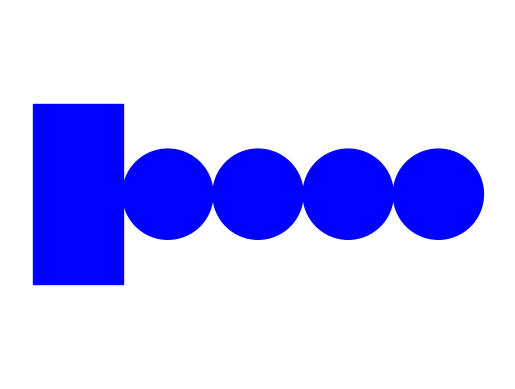

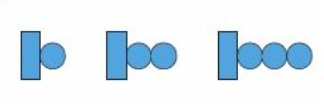

In [18]:
import turtle
GPTV("Well formed python code, only the code using matlab not turtle, do not add any comments or headders or explinations, just the code to best draw the next shape in the sequence in the image?", 'Images\ShapeQuestion.jpg', runcode=1)

HTML(value='<style>p{word-wrap: break-word}</style> <p><font size="2">What is wrong with this picture?<HR/><fo…

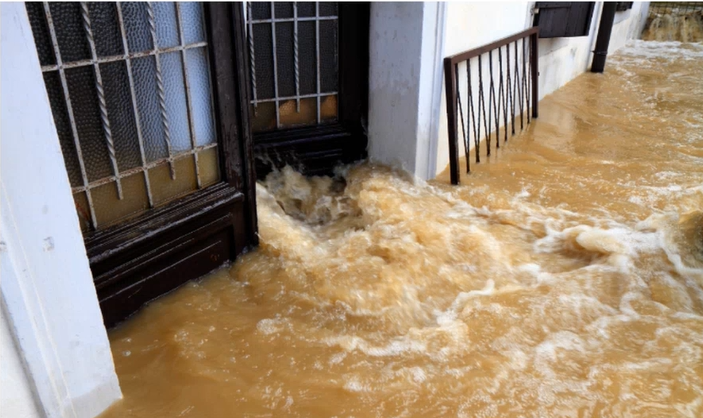

In [7]:
GPTV("What is wrong with this picture?", 'Images\\flood.png')

HTML(value='<style>p{word-wrap: break-word}</style> <p><font size="2">Give me the Dall-e 3 prompts to recreate…

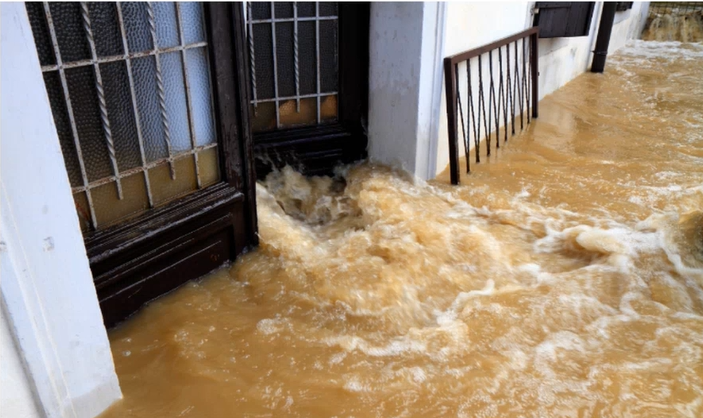

In [17]:
GPTV("Give me the Dall-e 3 prompts to recreate this picture: ", 'Images\\flood.png')

In [19]:
prompt = "1. A digital painting of muddy flood water rushing through an open doorway of a white building with black iron bars. 2. A realistic photograph of a flooded street with brown water overflowing into the entrance of a house with dark wooden doors. 3. An image of a strong current of murky water gushing into a residential building with white walls and a black metal railing on the staircase."

import os
from openai import AzureOpenAI
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams

client = AzureOpenAI(api_version="2023-12-01-preview",  
    api_key=open("AzurekeySweden.txt","r").read(),  
    azure_endpoint="https://SwedenOpenAIral.openai.azure.com/")

%matplotlib inline

response = client.images.generate(
    prompt=prompt,
    size='1024x1024', 
    model = "dalle3",
    n=1
)

#display an image from a url
from IPython.display import Image, display

#import ipywidgets as widgets
img_A = Image(url=response.data[0].url)
display(img_A)




HTML(value='<style>p{word-wrap: break-word}</style> <p><font size="2">Put these images in order and explain wh…

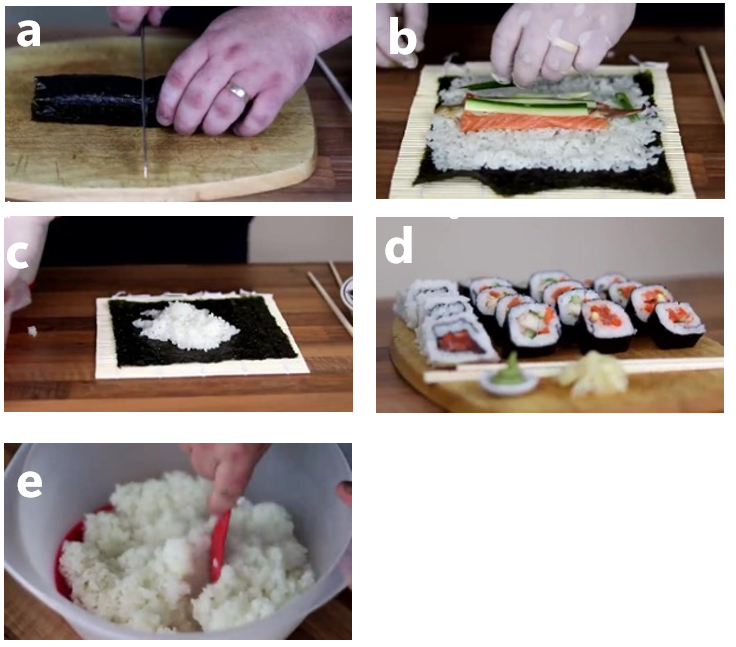

In [20]:
GPTV("Put these images in order and explain why", 'Images\Sushi.png')


HTML(value='<style>p{word-wrap: break-word}</style> <p><font size="2">What is this chart showing?<HR/><font si…

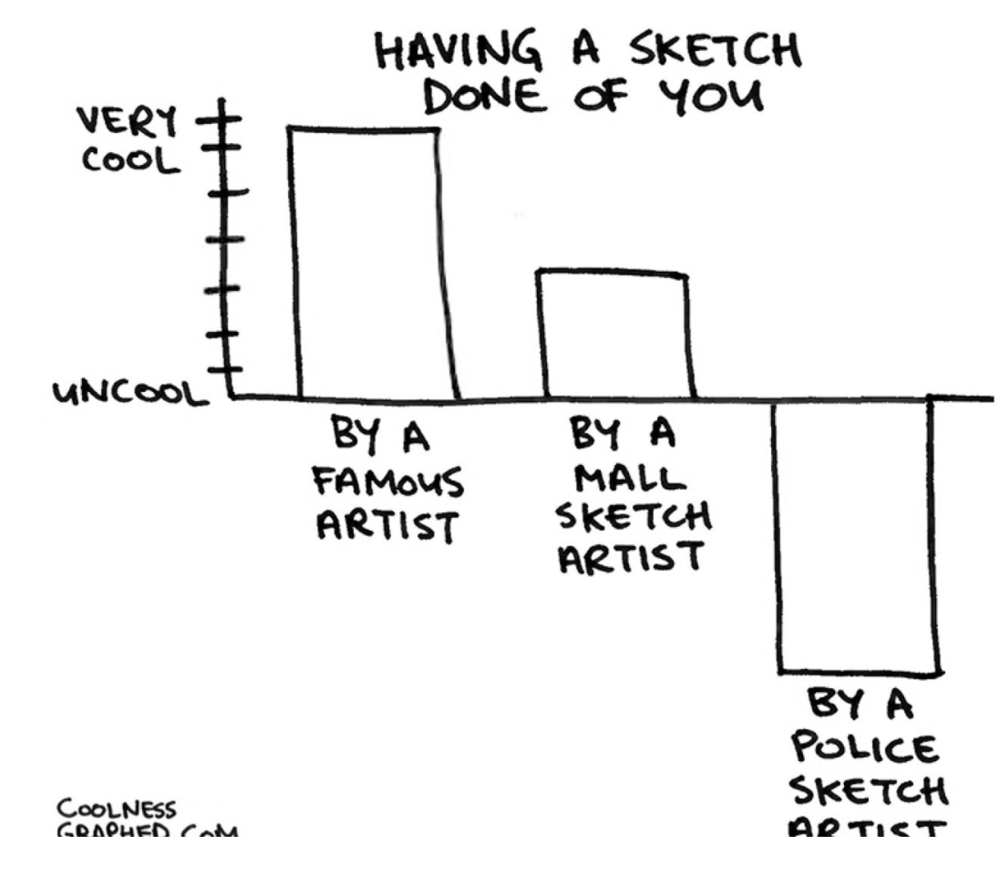

In [20]:
GPTV("What is this chart showing?", 'Images\ChartSk.png')

ValueError: The number of FixedLocator locations (3), usually from a call to set_ticks, does not match the number of labels (2).

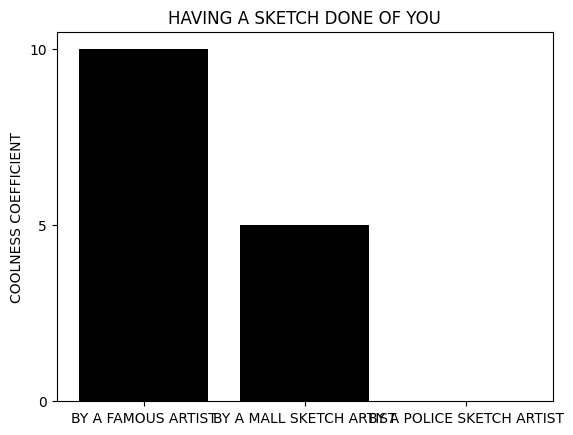

In [21]:
GPTV("Well formed python code, only the code using matlab not turtle, do not add any comments or headders or explinations, just the code to recreate this chart?", 'Images\ChartSk.png', runcode=1)

HTML(value='<style>p{word-wrap: break-word}</style> <p><font size="2">What could the punchline be?<HR/><font s…

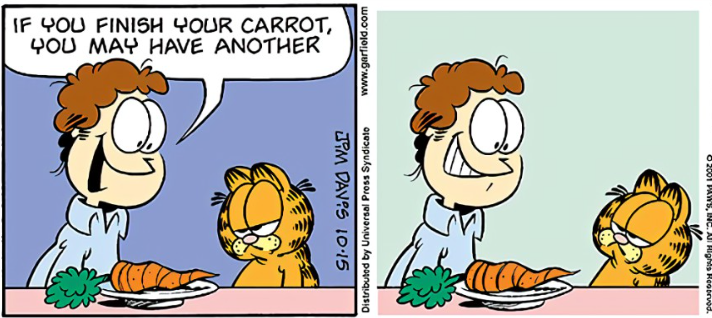

In [22]:
GPTV("What could the punchline be?", 'Images\gar.png')

HTML(value='<style>p{word-wrap: break-word}</style> <p><font size="2">What funny line could the delivery drive…

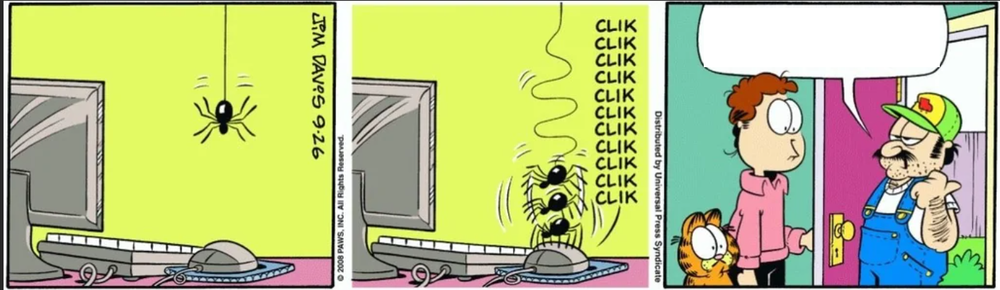

In [9]:
GPTV("What funny line could the delivery driver be saying?", 'Images\gar3.png')

![pic](Images\\Dilbert.jpg)


HTML(value='<style>p{word-wrap: break-word}</style> <p><font size="2">What could the punchline be?<HR/><font s…

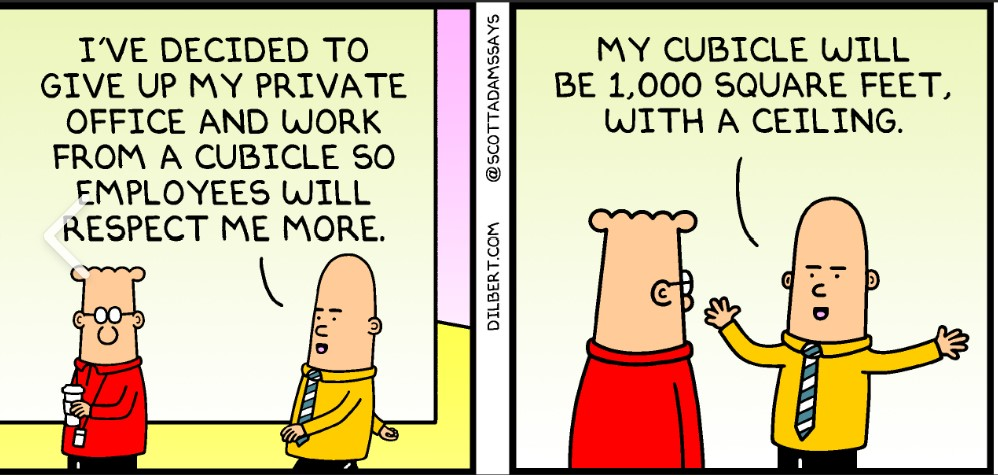

In [23]:
GPTV("What could the punchline be?", 'Images\Dilbert.jpg')

In [19]:
from IPython.display import display, Image, Audio

import cv2  # We're using OpenCV to read video, to install !pip install opencv-python
import base64
import time
from openai import OpenAI
import os
import requests


video = cv2.VideoCapture("Images/MouseMove.mp4")

base64Frames = []
while video.isOpened():
    success, frame = video.read()
    if not success:
        break
    _, buffer = cv2.imencode(".jpg", frame)
    base64Frames.append(base64.b64encode(buffer).decode("utf-8"))

video.release()
print(len(base64Frames), "frames read.")

51 frames read.


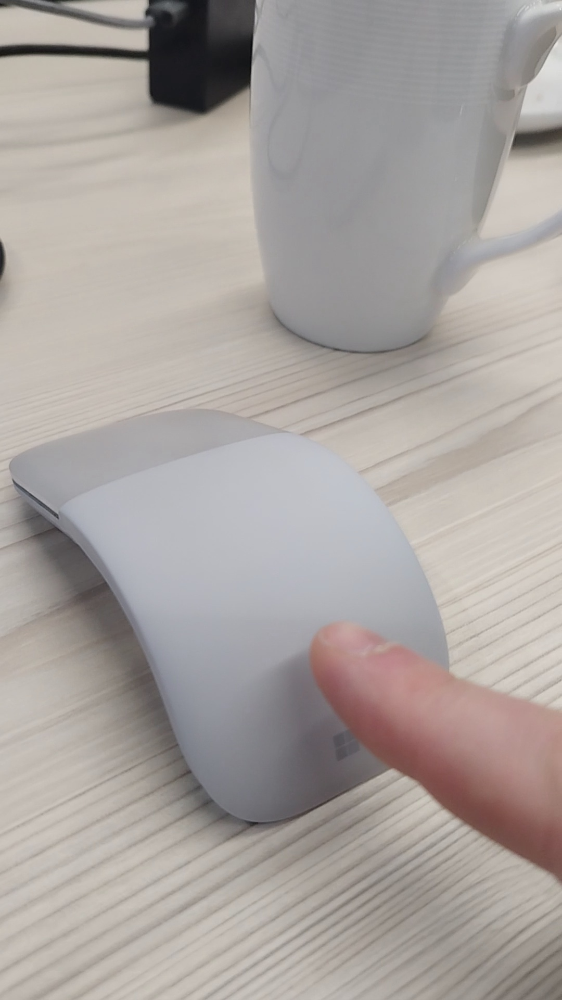

In [21]:
display_handle = display(None, display_id=True)
for img in base64Frames:
    display_handle.update(Image(data=base64.b64decode(img.encode("utf-8"))))
    time.sleep(0.025)

In [24]:
import os
from openai import OpenAI
from dotenv import load_dotenv
import base64
import mimetypes
load_dotenv()

import os
import openai
openai.api_type = "azure"
openai.api_base = "https://rsaistudio-aiservices.openai.azure.com/"
openai.api_version = "2023-07-01-preview"
openai.api_key = open("AzureKeySwedenProject.txt","r").read()
openai.azure_endpoint = "https://rsaistudio-aiservices.openai.azure.com/"

PROMPT_MESSAGES = [
    {
        "role": "user",
        "content": [
            "These are frames from a video that I want to upload. Describe what is happening in the video.",
            *map(lambda x: {"image": x, "resize": 768}, base64Frames[0::50]),
        ],
    },
]
params = {
    "model": "gpt-4_v",
    "messages": PROMPT_MESSAGES,
    "max_tokens": 200,
}

result = openai.chat.completions.create(**params)
print(result.choices[0].message.content)

Someone is clicking a computer mouse with their index finger.
